In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

from superpoint.settings import EXPER_PATH
import superpoint.evaluations.detector_evaluation as ev
from utils import plot_imgs
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [3]:
def draw_keypoints(img, corners, color, radius=3, s=3):
    img = np.repeat(cv2.resize(img, None, fx=s, fy=s)[..., np.newaxis], 3, -1)
    for c in np.stack(corners).T:
        cv2.circle(img, tuple(s*np.flip(c, 0)), radius, color, thickness=-1)
    return img
def select_top_k(prob, thresh=0, num=300):    
    pts = np.where(prob > thresh)
    idx = np.argsort(prob[pts])[::-1][:num]
    pts = (pts[0][idx], pts[1][idx])
    return pts

# HPatches Viewpoint

In [11]:
experiments = [
    'mp_synth-v6_photo-hom-aug_ha2-100-0_hp-v-repeat',
    'harris_hp-v-repeat',
    'fast_hp-v-repeat',
    'shi_hp-v-repeat'
]
confidence_thresholds = [0.001, 0, 0, 0]

### Images visualization

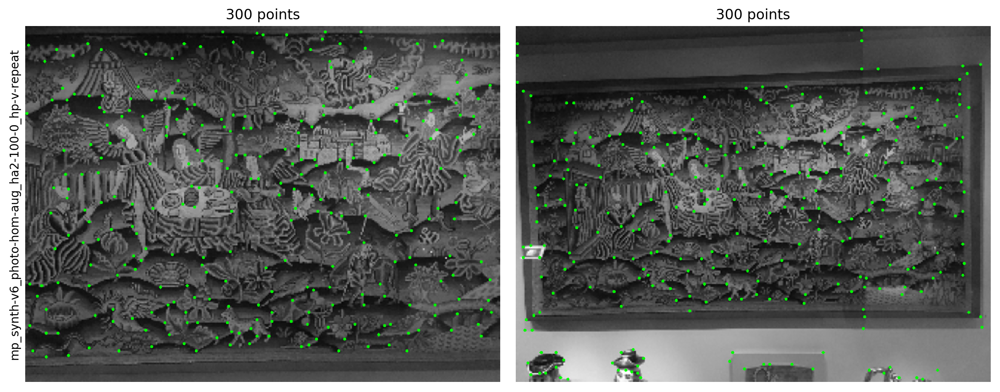

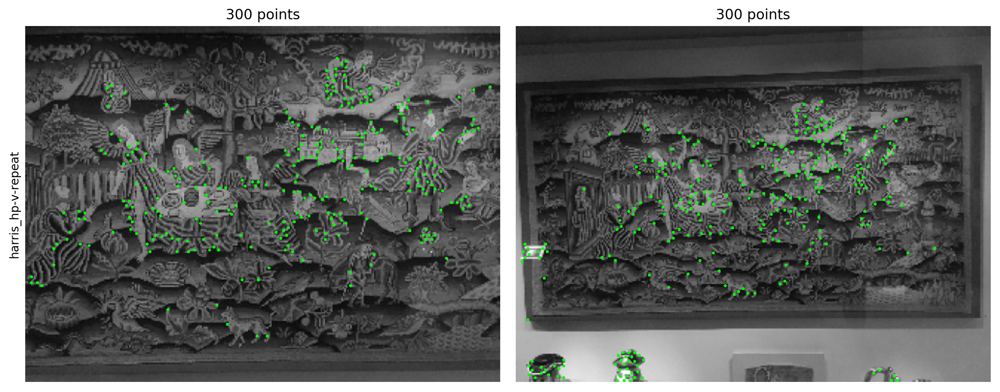

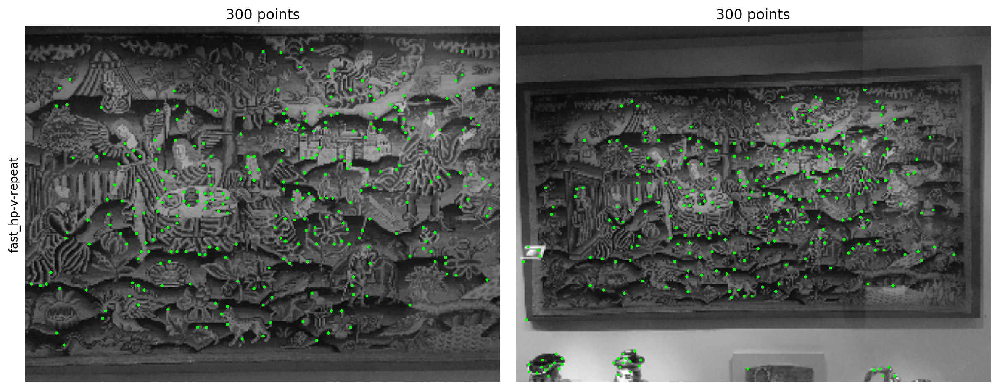

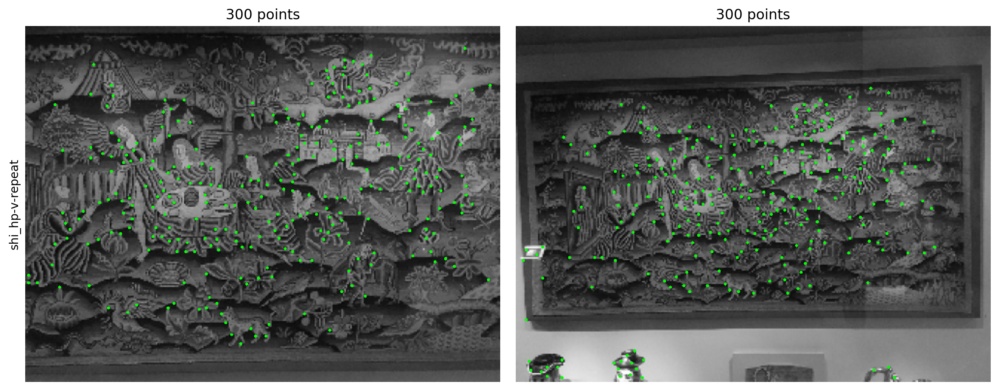

In [14]:
for i in range(1):
    for e, thresh in zip(experiments, confidence_thresholds):
        path = Path(EXPER_PATH, "outputs", e, str(i) + ".npz")
        d = np.load(path)
        
        points1 = select_top_k(d['prob'], thresh=thresh)
        im1 = draw_keypoints(d['image'][..., 0], points1, (0, 255, 0)) / 255.
        
        points2 = select_top_k(d['warped_prob'], thresh=thresh)
        im2 = draw_keypoints(d['warped_image'], points2, (0, 255, 0)) / 255.

        plot_imgs([im1, im2], ylabel=e, dpi=200, cmap='gray',
                  titles=[str(len(points1[0]))+' points', str(len(points2[0]))+' points'])

### Repeatability

In [14]:
for exp in experiments:
    repeatability = ev.compute_repeatability(exp, keep_k_points=300, distance_thresh=3, verbose=True)
    print('> {}: {}'.format(exp, repeatability))

Average number of points in the first image: 267.6305084745763
Average number of points in the second image: 208.0135593220339
> mp_synth-v6_photo-hom-aug_ha2-100-0_hp-v-repeat: 0.36473220951823115
Average number of points in the first image: 273.60677966101696
Average number of points in the second image: 223.10169491525423
> harris_hp-v-repeat: 0.4385058205753859
Average number of points in the first image: 275.7864406779661
Average number of points in the second image: 223.53898305084746
> fast_hp-v-repeat: 0.3734087888719382
Average number of points in the first image: 275.3728813559322
Average number of points in the second image: 222.43389830508474
> shi_hp-v-repeat: 0.3795002065683029


# HPatches Illumination

In [15]:
experiments = [
    'mp_synth-v6_photo-hom-aug_ha1-100-3-trained_hp-i-repeat',
    'harris_hp-i-repeat',
    'fast_hp-i-repeat',
    'shi_hp-i-repeat'
]
confidence_thresholds = [0.001, 0, 0, 0, 0]

### Images visualization

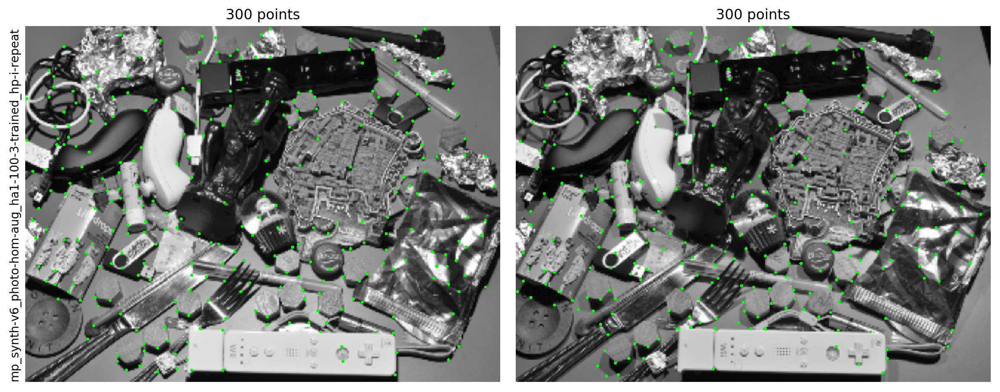

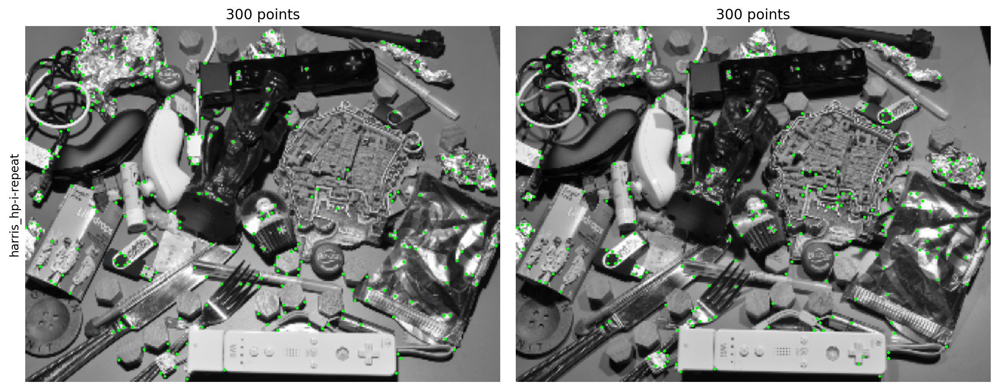

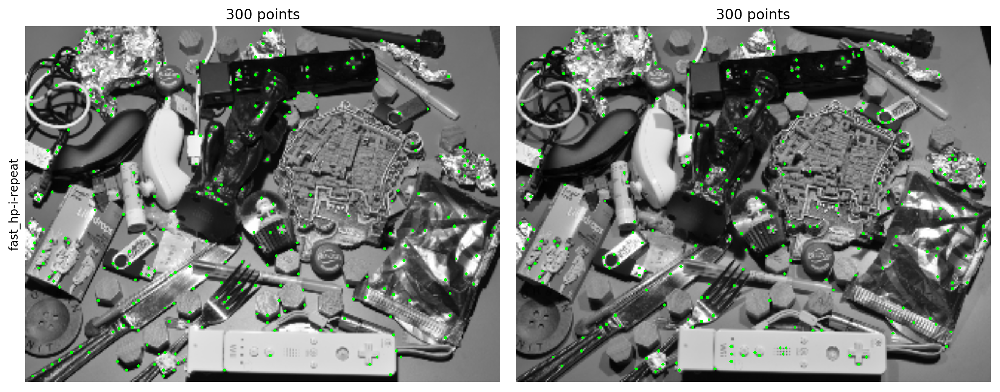

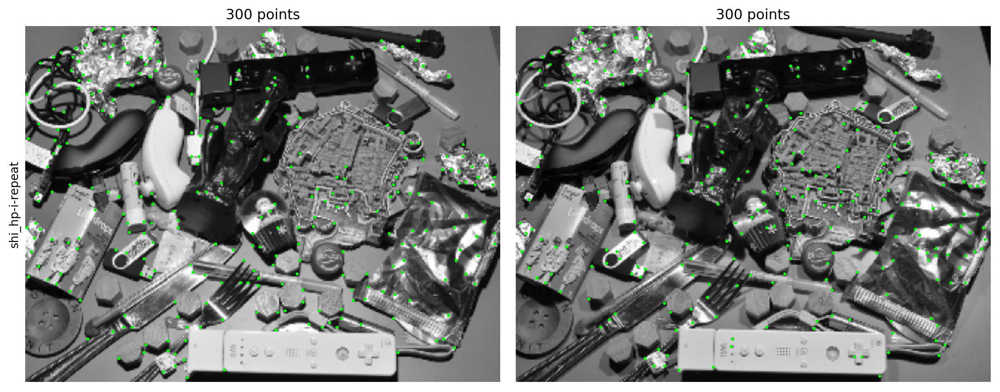

In [16]:
for i in range(1):
    for e, thresh in zip(experiments, confidence_thresholds):
        path = Path(EXPER_PATH, "outputs", e, str(i) + ".npz")
        d = np.load(path)
        
        points1 = select_top_k(d['prob'], thresh=thresh)
        im1 = draw_keypoints(d['image'][..., 0], points1, (0, 255, 0)) / 255.
        
        points2 = select_top_k(d['warped_prob'], thresh=thresh)
        im2 = draw_keypoints(d['warped_image'], points2, (0, 255, 0)) / 255.

        plot_imgs([im1, im2], ylabel=e, dpi=200, cmap='gray',
                  titles=[str(len(points1[0]))+' points', str(len(points2[0]))+' points'])

### Repeatability

In [23]:
for exp in experiments:
    repeatability = ev.compute_repeatability(exp, keep_k_points=300, distance_thresh=3, verbose=True)
    print('> {}: {}'.format(exp, repeatability))

Average number of points in the first image: 299.95087719298243
Average number of points in the second image: 299.8561403508772
> mp_synth-v6_photo-hom-aug_ha1-100-3-trained_hp-i-repeat: 0.6497595949642716
Average number of points in the first image: 299.940350877193
Average number of points in the second image: 299.78245614035086
> harris_hp-i-repeat: 0.6297611080052555
Average number of points in the first image: 299.97543859649124
Average number of points in the second image: 297.86315789473684
> fast_hp-i-repeat: 0.576520875390942
Average number of points in the first image: 299.95438596491226
Average number of points in the second image: 299.80350877192984
> shi_hp-i-repeat: 0.5832818113760635


# Visual proof that the homography is as expected

In [9]:
def get_true_keypoints(exper_name, prob_thresh=0.5):
    def warp_keypoints(keypoints, H):
        warped_col0 = np.add(np.sum(np.multiply(keypoints, H[0, :2]), axis=1), H[0, 2])
        warped_col1 = np.add(np.sum(np.multiply(keypoints, H[1, :2]), axis=1), H[1, 2])
        warped_col2 = np.add(np.sum(np.multiply(keypoints, H[2, :2]), axis=1), H[2, 2])
        warped_col0 = np.divide(warped_col0, warped_col2)
        warped_col1 = np.divide(warped_col1, warped_col2)
        new_keypoints = np.concatenate([warped_col0[:, None], warped_col1[:, None]],
                                       axis=1)
        return new_keypoints

    def filter_keypoints(points, shape):
        """ Keep only the points whose coordinates are
        inside the dimensions of shape. """
        mask = (points[:, 0] >= 0) & (points[:, 0] < shape[0]) &\
               (points[:, 1] >= 0) & (points[:, 1] < shape[1])
        return points[mask, :]
    
    true_keypoints = []
    for i in range(5):
        path = Path(EXPER_PATH, "outputs", exper_name, str(i) + ".npz")
        data = np.load(path)
        shape = data['warped_prob'].shape

        # Filter out predictions
        keypoints = np.where(data['prob'] > prob_thresh)
        keypoints = np.stack([keypoints[0], keypoints[1]], axis=-1)
        warped_keypoints = np.where(data['warped_prob'] > prob_thresh)
        warped_keypoints = np.stack([warped_keypoints[0], warped_keypoints[1]], axis=-1)

        # Warp the original keypoints with the true homography
        H = data['homography']
        true_warped_keypoints = warp_keypoints(keypoints[:, [1, 0]], H)
        true_warped_keypoints[:, [0, 1]] = true_warped_keypoints[:, [1, 0]]
        true_warped_keypoints = filter_keypoints(true_warped_keypoints, shape)
        true_keypoints.append((true_warped_keypoints[:, 0], true_warped_keypoints[:, 1]))
        
    return true_keypoints

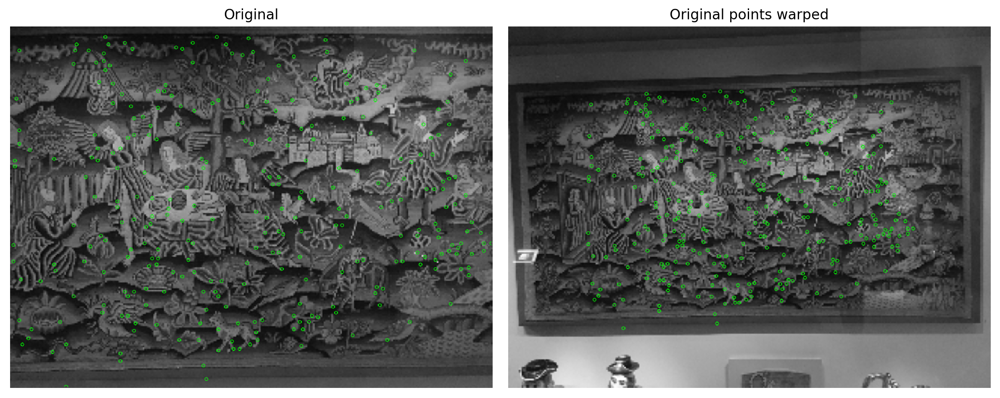

In [10]:
true_keypoints = get_true_keypoints('magic-point_hpatches_viewpoint_repeatability', 0.015)
for i in range(1):
    e = 'magic-point_hpatches_viewpoint_repeatability'
    thresh = 0.015
    path = Path(EXPER_PATH, "outputs", e, str(i) + ".npz")
    d = np.load(path)
        
    points1 = np.where(d['prob'] > thresh)
    im1 = draw_keypoints(d['image'][..., 0], points1, (0, 255, 0)) / 255.
        
    points2 = true_keypoints[i]
    im2 = draw_keypoints(d['warped_image'][..., 0], points2, (0, 255, 0)) / 255.
        
    plot_imgs([im1, im2], titles=['Original', 'Original points warped'], dpi=200, cmap='gray')